# Stable Diffusion with 🤗 Diffusers

This notebook introduces Stable Diffusion, the highest-quality open source text to image model as of now. It's also small enough to run in consumer GPUs rather than in a datacenter. We use the 🤗 Hugging Face 🧨 Diffusers library, which is currently our recommended library for using diffusion models.

## Using Stable Diffusion

To run Stable Diffusion on your computer you have to accept the model license. It's an open CreativeML OpenRail-M license that claims no rights on the outputs you generate and prohibits you from deliberately producing illegal or harmful content. The model card provides more details. If you do accept the license, you need to be a registered user in 🤗 Hugging Face Hub and use an access token for the code to work. You have two options to provide your access token:

1. Use the huggingface-cli login command-line tool in your terminal and paste your token when prompted. It will be saved in a file in your computer.
2. Or use notebook_login() in a notebook, which does the same thing.

In [1]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

`StableDiffusionPipeline` is an end-to-end diffusion inference pipeline that allows you to start generating images with just a few lines of code. Many Hugging Face libraries (along with other libraries such as scikit-learn) use the concept of a "pipeline" to indicate a sequence of steps that when combined complete some task. We'll look at the individual steps of the pipeline later -- for now though, let's just use it to see what it can do.

When we say "inference" we're referring to using an existing model to generate samples (in this case, images), as opposed to "training" (or fine-tuning) models using new data.

We use `from_pretrained` to create the pipeline and download the pretrained weights. We indicate that we want to use the `fp16` (half-precision) version of the weights, and we tell diffusers to expect the weights in that format. This allows us to perform much faster inference with almost no discernible difference in quality. The string passed to `from_pretrained` in this case (`CompVis/stable-diffusion-v1-4`) is the repo id of a pretrained pipeline hosted on Hugging Face Hub; it can also be a path to a directory containing pipeline weights. The weights for all the models in the pipeline will be downloaded and cached the first time you run this cell.

In [2]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/gradients/gradients/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


The weights are cached in your home directory by default.

In [3]:
!ls ~/.cache/huggingface/hub

models--CompVis--stable-diffusion-v1-4	version.txt
models--openai--clip-vit-large-patch14	version_diffusers_cache.txt


We are now ready to use the pipeline to start creating images.

If your GPU is not big enough to use pipe, run `pipe.enable_attention_slicing()`

As described in the docs:

When this option is enabled, the attention module will split the input tensor in slices, to compute attention in several steps. This is useful to save some memory in exchange for a small speed decrease.

In [4]:
# pipe.enable_attention_slicing()

In [5]:
prompt = "a photograph of an astronaut riding a horse"

  0%|          | 0/50 [00:00<?, ?it/s]

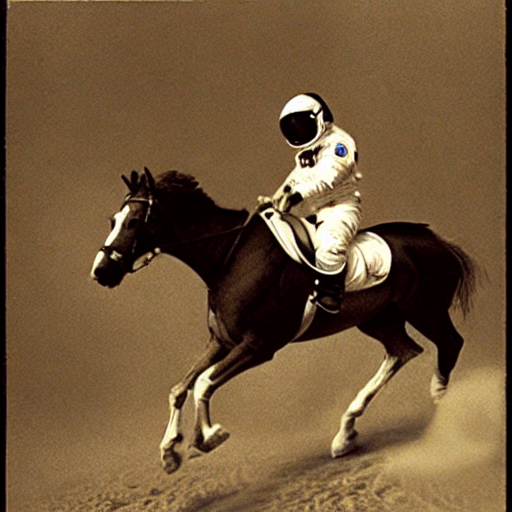

In [6]:
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

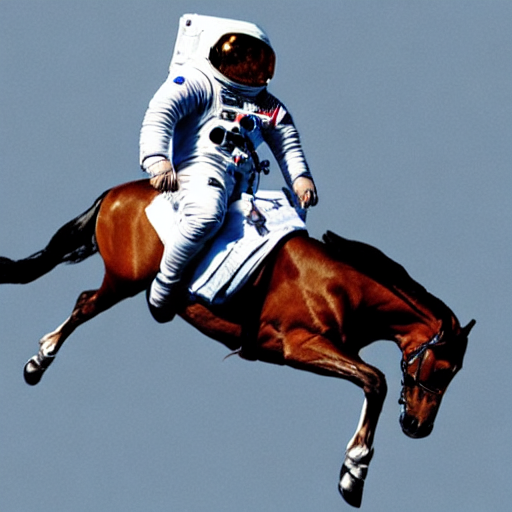

In [7]:
torch.manual_seed(1024)
pipe(prompt).images[0]

You will have noticed that running the pipeline shows a progress bar with a certain number of steps. This is because Stable Diffusion is based on a progressive denoising algorithm that is able to create a convincing image starting from pure random noise. Models in this family are known as diffusion models. Here's an example of the process (from random noise at top to progressively improved images towards the bottom) of a model drawing handwritten digits.

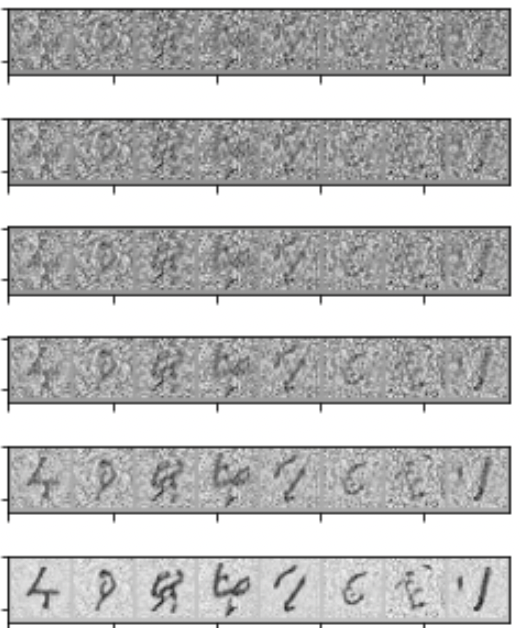

  0%|          | 0/3 [00:00<?, ?it/s]

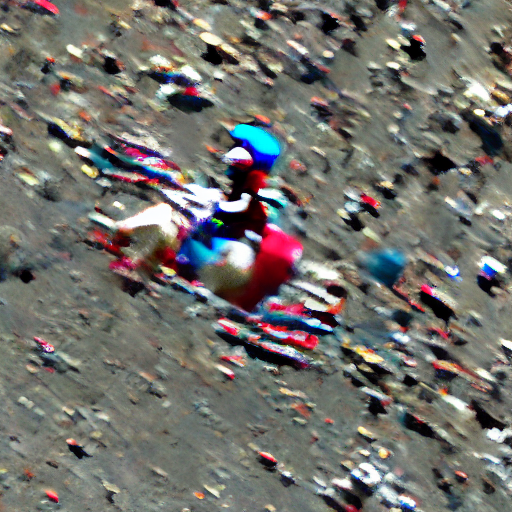

In [8]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=3).images[0]

  0%|          | 0/4 [00:00<?, ?it/s]

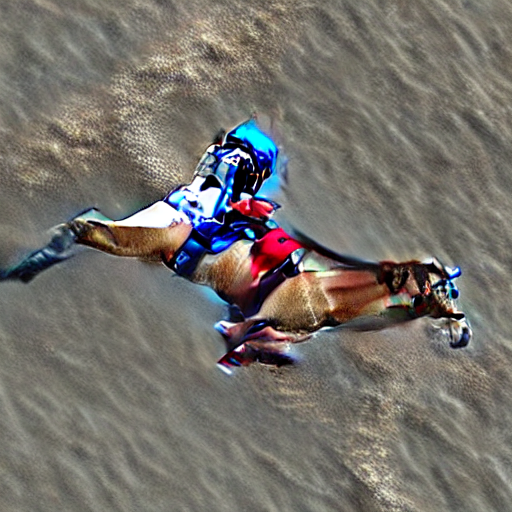

In [9]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=4).images[0]

  0%|          | 0/5 [00:00<?, ?it/s]

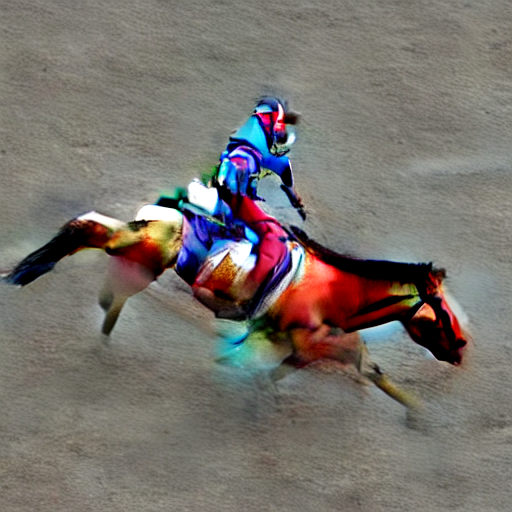

In [10]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=5).images[0]

  0%|          | 0/19 [00:00<?, ?it/s]

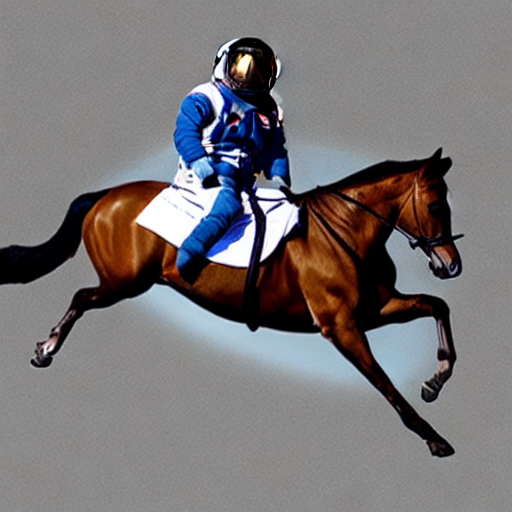

In [11]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=19).images[0]

In [12]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

Classifier-Free Guidance is a method to increase the adherence of the output to the conditioning signal we used (the text).

Roughly speaking, the larger the guidance the more the model tries to represent the text prompt. However, large values tend to produce less diversity. The default is 7.5, which represents a good compromise between variety and fidelity.

We can generate multiple images for the same prompt by simply passing a list of prompts instead of a string.

In [13]:
num_rows,num_cols = 4,4
prompts = [prompt] * num_cols

In [14]:
images = concat(pipe(prompts, guidance_scale=g).images for g in [1.1,3,7,14])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

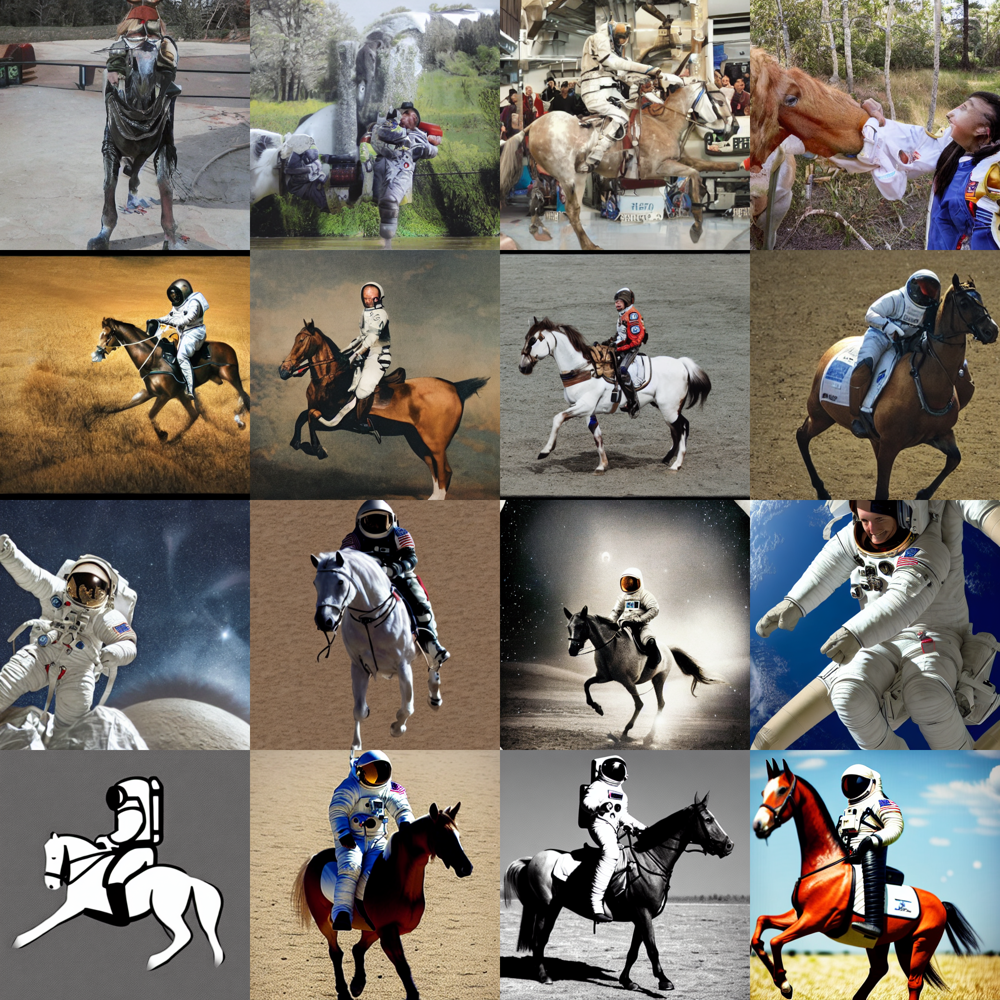

In [15]:
image_grid(images, rows=num_rows, cols=num_cols)

Negative prompting refers to the use of another prompt (instead of a completely unconditioned generation), and scaling the difference between generations of that prompt and the conditioned generation.

  0%|          | 0/50 [00:00<?, ?it/s]

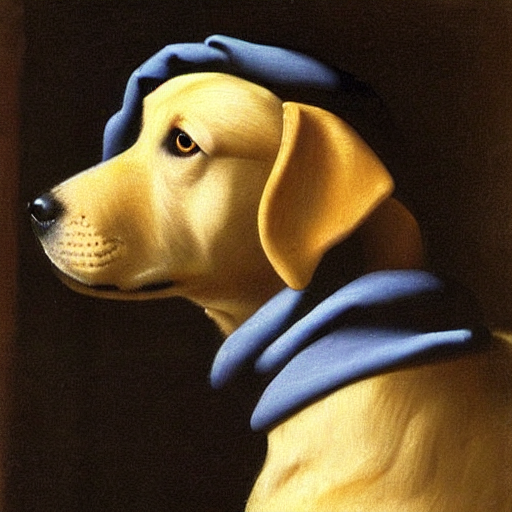

In [16]:
torch.manual_seed(1000)
prompt = "Labrador in the style of Vermeer"
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

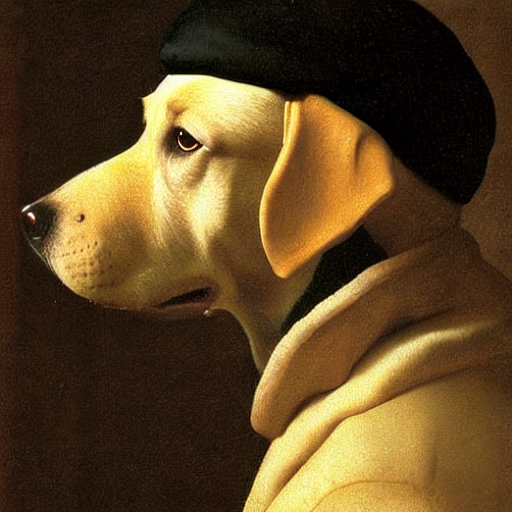

In [17]:
torch.manual_seed(1000)
pipe(prompt, negative_prompt="blue").images[0]

By using the negative prompt we move more towards the direction of the positive prompt, effectively reducing the importance of the negative prompt in our composition.